## AIDA reactive experiments

In [1]:
using Rocket
using ReactiveMP
using GraphPPL
using Distributions
using LinearAlgebra
import ProgressMeter
using WAV
using Plots
using AIDA

┌ Info: Precompiling AIDA [02ab3c64-7f6e-4624-92b1-4056b28faae1]
└ @ Base loading.jl:1317


In [35]:
input_SNR = "5dB"
input_context = "train"
input_fn = "sp05";

In [36]:
# load clean speech
cl, fs = wavread("../sound/NOIZEUS/clean/$(input_fn).wav")
cl_seg = get_frames(cl, fs);
totseg = size(cl_seg, 1)

294

In [37]:
bbl, fs = wavread("../sound/NOIZEUS/$(input_context)/$(input_SNR)/$(input_fn)_$(input_context)_sn$(input_SNR[1:end-2]).wav")
bbl_seg = get_frames(bbl, fs);
totseg = size(bbl_seg, 1)

294

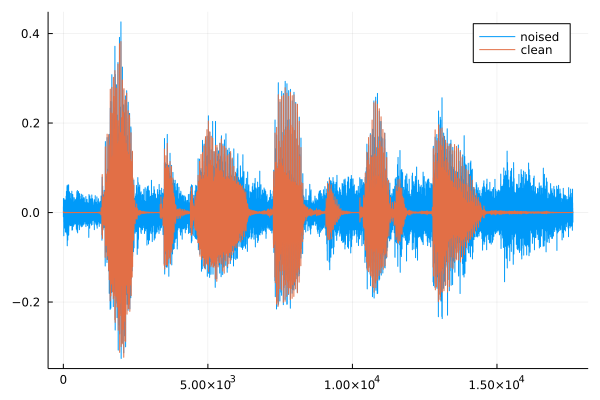

In [38]:
plot(bbl, label="noised")
plot!(cl, label="clean")

In [39]:
# storage of FEs for each segment
ar_order = 10
vmp_iter = 20
fe_ar = zeros(totseg, vmp_iter)
fe_gaussian = zeros(totseg, vmp_iter)
mτs = [];

In [40]:
# compute free energies of two models (gaussian for silent frame, lar for voiced frame)
ProgressMeter.@showprogress for segnum in 1:totseg
    inputs, outputs = ar_ssm(bbl_seg[segnum, :], ar_order)
    γ, τ, θ, x, fear = lar_inference(outputs, vmp_iter, priors=Dict(:aτ => 1e-4, :bτ => 1e-4, 
                                                                    :aγ => 1e-4, :bγ => 1e-4, 
                                                                    :order => ar_order))
    fe_ar[segnum, :] = fear
    
    x, τ, fegas = inference_gaussian(outputs, vmp_iter, priors=Dict(:aτ => 1e-4, :bτ => 1e-4))
    push!(mτs, τ)
    fe_gaussian[segnum, :] = fegas
end

Progress: 100%|█████████████████████████████████████████| Time: 0:02:36


In [41]:
# detect silent frames based on model comparison (1 - voiced, 0 - silent)
vad = [x[end] < y[end] for (x, y) in zip(eachrow(fe_ar), eachrow(fe_gaussian))];

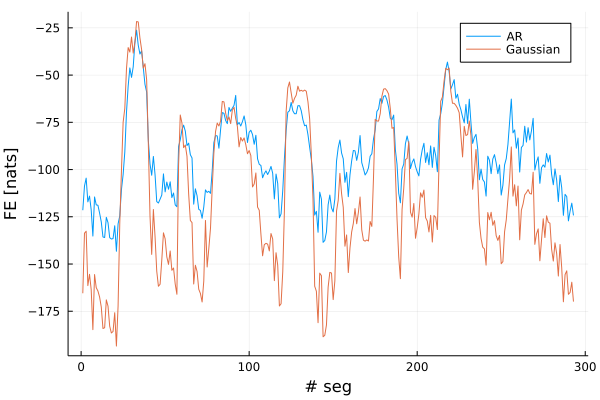

In [42]:
plot(fe_ar[1:end-1, end], label="AR")
plot!(fe_gaussian[1:end-1, end], label="Gaussian", ylabel="FE [nats]", xlabel="# seg")

In [43]:
using ImageCore

activities = get_signal(Float64.(hcat([repeat([vd], size(bbl_seg, 2)) for vd in vad]...))', fs)
cmap = colorsigned(color("blue"), color("red")) ∘ scalesigned(0, 0.5, 1.0)
colors = cmap.(activities)
plot(bbl, label="noised")
plot!(cl, label="clean")
scatter!(activities .- 0.5, label=false, color=colors, markerstrokewidth=0.0, markersize=0.6, markershape=:star)

In [44]:
babble = get_signal(bbl_seg[findall(isequal(0), vad), :], fs)

14400-element Vector{Float64}:
  0.013397625659962768
 -0.00946073793755913
 -0.006439405499435408
  0.03137302774132512
  0.018707846308786278
 -0.005371257667775506
  0.00772118289742729
  0.022980437635425885
  0.02478102969450972
  0.007904293954283274
 -0.007202368236335337
 -0.0019531846064638203
 -0.021362956633198035
  ⋮
  0.0
  0.0
  0.0
  0.0
  0.0
  0.0
  0.0
  0.0
  0.0
  0.0
  0.0
  0.0

In [45]:
# get empirical prior for babble noise
# τ_emp = 1365.4296025048907
τ_emp = inv(cov(babble))

705.2858805392677

In [46]:
aτ_ = mean(first.(params.(mτs[findall(isequal(0), vad)])))
bτ_ = mean(last.(params.(mτs[findall(isequal(0), vad)])));

## LAR model with **fixed** measurement noise

In [47]:
bblmx, bblvx, bblmθ, bblvθ, bblγ, fe = lar_batch_learning(bbl_seg, 10, Dict(:τ => τ_emp, :aγ => 1.0, :bγ => 1e-4, :order => 10));

Progress: 100%|█████████████████████████████████████████| Time: 0:02:20


In [48]:
mx = get_signal(bblmx, fs)
vx = get_signal(bblvx, fs);

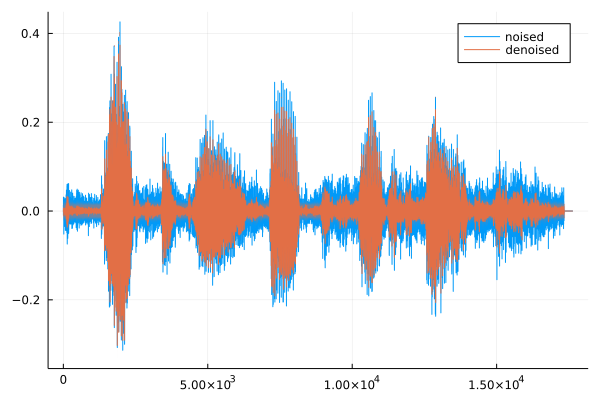

In [49]:
plot(signal_alignment(bbl, fs), label="noised")
# plot!(signal_alignment(cl, fs), label="clean")
plot!(mx, ribbon=sqrt.(vx), label="denoised")

In [50]:
snr_before = SNR_2(signal_alignment(cl, fs), signal_alignment(bbl, fs))
snr_after = SNR_2(signal_alignment(cl, fs), mx)
snr_after - snr_before

4.394627316206874

## LAR model with **unknown** measurement noise

In [51]:
bblmx, bblvx, bblmθ, bblvθ, bblγ = lar_batch_learning(bbl_seg, 10, Dict(:aτ => aτ_, :bτ => bτ_, :aγ => 1.0, :bγ => 1e-4, :order => 10));

Progress: 100%|█████████████████████████████████████████| Time: 0:02:22


In [52]:
mx = get_signal(bblmx, fs)
vx = get_signal(bblvx, fs);

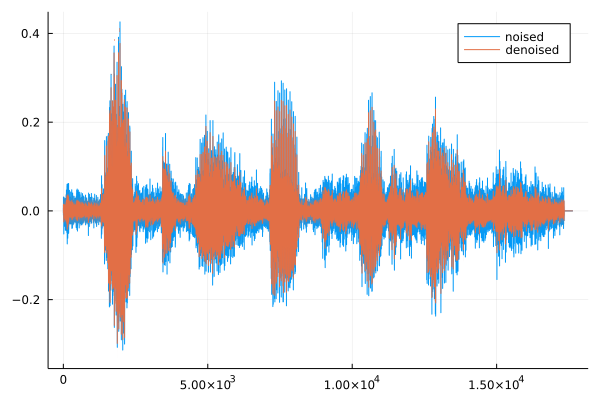

In [53]:
plot(signal_alignment(bbl, fs), label="noised")
plot!(mx, ribbon=sqrt.(vx), label="denoised")

In [54]:
snr_before = SNR_2(signal_alignment(cl, fs), signal_alignment(bbl, fs))
snr_after = SNR_2(signal_alignment(cl, fs), mx)
snr_after - snr_before

3.4308105519830034

## Coupled model (AR speech + AR noise)

In [55]:
mη, vη, τ = prior_to_priors(zeros(2), diageye(2), (aτ_, bτ_), totseg, 2);
rmz, rvz, rmθ, rvθ, rγ, rmx, rvx, rmη, rvη, rτ, fe = batch_coupled_learning(bbl_seg, [mη, vη], τ, 10, 2, 10);

Progress: 100%|█████████████████████████████████████████| Time: 0:05:40


In [56]:
rz, rx = get_signal(rmz, fs), get_signal(rmx, fs)
vz, vx = get_signal(rvz, fs), get_signal(rvx, fs);

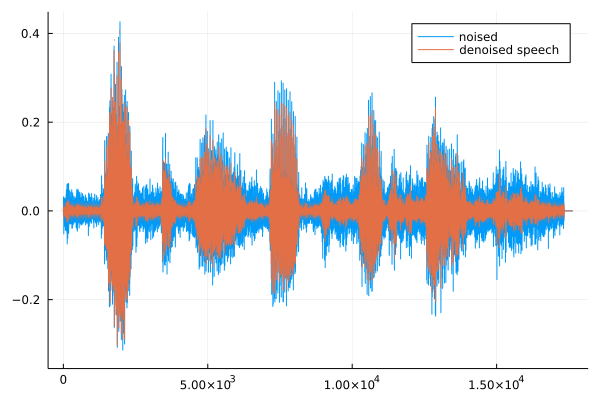

In [57]:
# plot(signal_alignment(cl, fs), label="clean")
plot(signal_alignment(bbl, fs), label="noised")
plot!(rz, ribbon=sqrt.(vz), label="denoised speech")
# plot!(rx, ribbon=sqrt.(vx), label="babble")

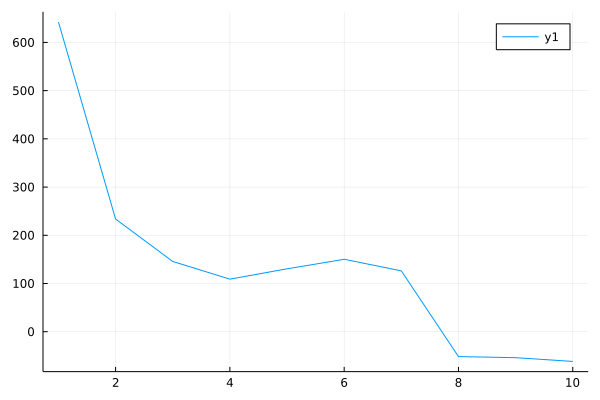

In [58]:
plot(fe[1, :])

In [59]:
snr_before = SNR_2(signal_alignment(cl, fs), signal_alignment(bbl, fs))
snr_after = SNR_2(signal_alignment(cl, fs), rz)
snr_after - snr_before

4.2727953018784355

In [ ]:
p1, p2 = calc_PESQ(signal_alignment(cl, fs), signal_alignment(bbl, fs), get_signal(rmz, fs), fs)

In [97]:
pesq_gain = p2 - p1

0.1526474952697754